Indeed 

In [1]:
#!pip install langdetect
#!pip install wordcloud
#!pip install -U textblob
#!pip install spacy

In [2]:
#!pip install gensim

In [25]:
from warnings import filterwarnings

In [26]:
## for data
import numpy  as np  
import pandas as pd
import collections
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
import wordcloud
## for text processing
import re
import nltk
## for language detection
import langdetect 
## for sentiment
from textblob import TextBlob
## for ner
import spacy
## for vectorizer
from sklearn import feature_extraction, manifold
## for word embedding
import gensim.downloader as gensim_api
## for topic modeling
import gensim

import random

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import chi2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve

In [27]:
data = pd.read_csv('/Volumes/T7 warehouse/Dropbox/Irena/dev/cursos/big data/practica-final/analysis-exploration-nlp/merge_all.csv',
                    error_bad_lines=False, engine="python")

/var/folders/3z/343f53t53zq9pj_l_rd_kmy00000gn/T/ipykernel_5141/3363942150.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  data = pd.read_csv('/Volumes/T7 warehouse/Dropbox/Irena/dev/cursos/big data/practica-final/analysis-exploration-nlp/merge_all.csv',


In [28]:
data.shape

(8773, 13)

In [29]:
#pd.set_option('display.max_rows', None)
#data['company_location'].value_counts()

In [30]:
print('Tamaño del dataset -->', data.shape)
data.isnull().sum()

Tamaño del dataset --> (8773, 13)


work_year                0
experience_level      4316
employment_type          0
job                    555
job_title                0
salary                   0
salary_currency          0
salary_in_usd            0
employee_residence      12
remote_ratio             0
company_location        12
company_size          1300
job_summary           2106
dtype: int64

In [31]:
data = data.drop(['experience_level', 'employment_type', 'salary_currency', 'salary_in_usd','remote_ratio', 'company_size'], axis=1)

In [32]:
data = data.dropna(subset=["job_summary"])
print('Tamaño del dataset -->', data.shape)

Tamaño del dataset --> (6667, 7)


In [33]:
data.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary
2099,2022,Cyber Security,Security Advisor,110107,Australia,Australia,Trustwave is a leading cybersecurity and manag...
2100,2022,Cyber Security,Cyber Security,140000,Australia,Australia,About the job: What makes Cognizant a unique p...
2101,2022,DevOps,Graduate Security Systems Engineer,55000,Australia,Australia,"Have you studied Mechatronic, Electrical or In..."
2102,2022,Cyber Security,Information Security Officer/Cyber Security Sp...,141902,Australia,Australia,Posted: 16/08/2022Closing Date: 15/09/2022Job ...
2103,2022,Cyber Security,Penetration Tester / Cyber Security Specialist,86848,Australia,Australia,IT & Telecomms IT Security Sydney Permanent / ...


In [34]:
print("NULL---->")
print(data.isnull().sum())
print("TYPES---->")
print(data.dtypes)

NULL---->
work_year               0
job                   415
job_title               0
salary                  0
employee_residence      0
company_location        0
job_summary             0
dtype: int64
TYPES---->
work_year              int64
job                   object
job_title             object
salary                 int64
employee_residence    object
company_location      object
job_summary           object
dtype: object


In [35]:
data[(data == 'Mexico').any(axis=1)]

,work_year,job,job_title,salary,employee_residence,company_location,job_summary
2580,2022,NaN,Ethical Hacker Jr Home Office CDMX,228000,Mexico,Mexico,Somos un grupo de empresas dedicas a solucione...
2581,2022,Data Scientist,Human Resources Manager,720000,Mexico,Mexico,"Digital Forensics Corp., a national industry l..."
2582,2022,Data Scientist,Operations Support Analyst,960000,Mexico,Mexico,ABOUT THE ROLE(This position is to move to USA...
2583,2022,Cyber Security,Cyber Security Project Manager,720000,Mexico,Mexico,Essential Background RequirementsUniversity le...
2584,2022,Cyber Security,Arquitecto Datos Cyber Security,498000,Mexico,Mexico,Importante empresa se encuentra en búsqueda de...
...,...,...,...,...,...,...,...
6754,2022,Web Developer,Full Stack Developer,420000,Mexico,Mexico,Full Stack DeveloperAcerca de MexikooMexikoo e...
6755,2022,NaN,Becario Programador Para Tulancingo,96000,Mexico,Mexico,"software Developer (Front-End, Back-End)En SIG..."
6756,2022,Mobile Developer,iOS Developer,408000,Mexico,Mexico,"IRONBIT, somos una firma con más de 16 años de..."
6757,2022,Web Developer,Backend Developer,690000,Mexico,Mexico,Integon Service Co. supports its insurance com...


In [36]:
data = data.dropna(subset=["job"])
data = data.dropna(subset=["employee_residence"])
print('Tamaño del dataset -->', data.shape)

Tamaño del dataset --> (6252, 7)


Breve exploración de la dsitribución de nuestro dataset según tipo de empleo

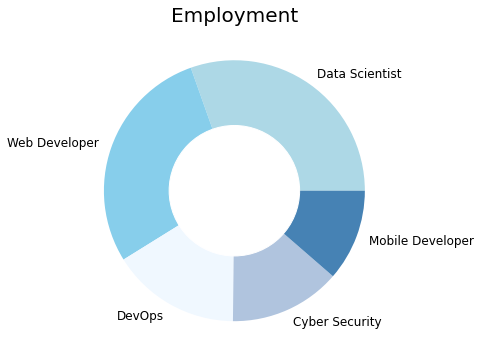

In [38]:
job = data['job'].value_counts()
numbers = job.index
quantity = job.values

# visualizamos las distribuciones
custom_colors = ['lightblue', 'skyblue' , 'aliceblue', 'lightsteelblue', 'steelblue']

plt.figure(figsize=(8, 6))
plt.pie(quantity, labels=numbers, colors=custom_colors)
central_circle = plt.Circle((0, 0), 0.5, color='white')
fig = plt.gcf()
fig.gca().add_artist(central_circle)
plt.rc('font', size=12)
plt.title('Employment', fontsize=20)

plt.show()

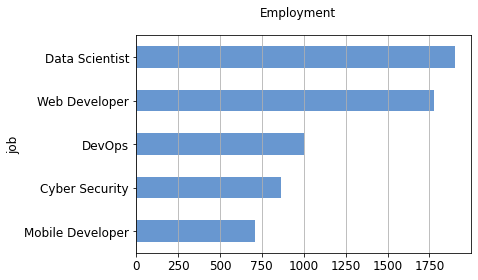

In [39]:
fig, ax = plt.subplots()
fig.suptitle("Employment", fontsize=12)
data["job"].reset_index().groupby("job").count().sort_values(by= 
       "index").plot(kind="barh", color = "#6897d0", legend=False, ax=ax).grid(axis='x')
plt.show()

Creamos una nueva columna 'language' para detectar el idioma de cada job_description

In [40]:
data['language'] = data["job_summary"].apply(lambda x: langdetect.detect(x) if 
                                 x.strip() != "" else "")

In [41]:
data.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2099,2022,Cyber Security,Security Advisor,110107,Australia,Australia,Trustwave is a leading cybersecurity and manag...,en
2100,2022,Cyber Security,Cyber Security,140000,Australia,Australia,About the job: What makes Cognizant a unique p...,en
2101,2022,DevOps,Graduate Security Systems Engineer,55000,Australia,Australia,"Have you studied Mechatronic, Electrical or In...",en
2102,2022,Cyber Security,Information Security Officer/Cyber Security Sp...,141902,Australia,Australia,Posted: 16/08/2022Closing Date: 15/09/2022Job ...,en
2103,2022,Cyber Security,Penetration Tester / Cyber Security Specialist,86848,Australia,Australia,IT & Telecomms IT Security Sydney Permanent / ...,en


In [42]:
# comprobamos cuantos idiomas contiene nuestro dataset y nos centramos solo en las muestras en inglés (en)
print("Lenguajes presentes en el dataset -->", data['language'].unique())
print("Número de muestras en inglés ------->", data['language'].value_counts()['en'])

Lenguajes presentes en el dataset --> ['en' 'fr' 'es' 'nl' 'de']
Número de muestras en inglés -------> 5318


Tamaño final del dataset -------> (5318, 8)


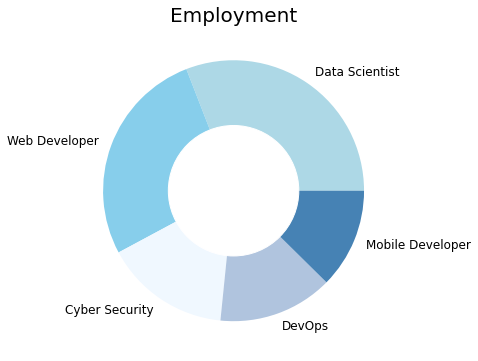

In [43]:
# nos quedamos con las muestras en inglés
data = data.drop(data[data.language != "en"].index)
print("Tamaño final del dataset ------->", data.shape)

job = data['job'].value_counts()
numbers = job.index
quantity = job.values

# visualizamos las distribuciones
custom_colors = ['lightblue', 'skyblue' , 'aliceblue', 'lightsteelblue', 'steelblue']

plt.figure(figsize=(8, 6))
plt.pie(quantity, labels=numbers, colors=custom_colors)
central_circle = plt.Circle((0, 0), 0.5, color='white')
fig = plt.gcf()
fig.gca().add_artist(central_circle)
plt.rc('font', size=12)
plt.title('Employment', fontsize=20)

plt.show()

Exploración en títulos

In [44]:
data.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2099,2022,Cyber Security,Security Advisor,110107,Australia,Australia,Trustwave is a leading cybersecurity and manag...,en
2100,2022,Cyber Security,Cyber Security,140000,Australia,Australia,About the job: What makes Cognizant a unique p...,en
2101,2022,DevOps,Graduate Security Systems Engineer,55000,Australia,Australia,"Have you studied Mechatronic, Electrical or In...",en
2102,2022,Cyber Security,Information Security Officer/Cyber Security Sp...,141902,Australia,Australia,Posted: 16/08/2022Closing Date: 15/09/2022Job ...,en
2103,2022,Cyber Security,Penetration Tester / Cyber Security Specialist,86848,Australia,Australia,IT & Telecomms IT Security Sydney Permanent / ...,en


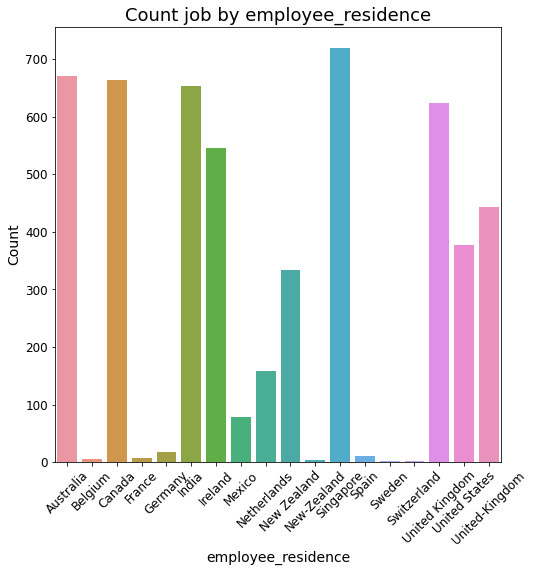

In [45]:
data_job = data.groupby('employee_residence').count().reset_index()[['employee_residence','job']]

f, ax = plt.subplots(figsize=(8,8))
plt.xticks(rotation=45)

sns.barplot(x='employee_residence', y='job', data=data_job)

ax.set_title('Count job by employee_residence', fontsize=18)
ax.set_xlabel('employee_residence', fontsize=14)
ax.set_ylabel('Count', fontsize=14);

Topic Modeling / Latent Dirichlet Allocation (LDA)

Vamos a analizar los posibles patrones entre las descripciones según el tipo de empelo empleando LDA

In [46]:
text_len = data.job_summary.apply(lambda x: len(x))

print('\nLongitud mínima de job_summary:', text_len.min())
print('\nLongitud máxima de job_summary:', text_len.max())
print('\nLongitud media de job_summary:', int(text_len.mean()))


Longitud mínima de job_summary: 249

Longitud máxima de job_summary: 65535

Longitud media de job_summary: 9631


In [47]:
# importing TFIDF vectorizer
from sklearn.feature_extraction.text import CountVectorizer

# creating an instance
cv = CountVectorizer(max_df = 0.90, min_df = 2, stop_words = 'english')

# fit and transform the text data
cv_fit = cv.fit_transform(data.job_summary)

print('\nTamaño de la matriz\n')
cv_fit


Tamaño de la matriz



<5318x21468 sparse matrix of type '<class 'numpy.int64'>'
	with 1092421 stored elements in Compressed Sparse Row format>

Latent Dirichlet Allocation (LDA)

In [48]:
# importing Latent Dirichlet Allocation library
from sklearn.decomposition import LatentDirichletAllocation

# creating an instance for LDA
lda = LatentDirichletAllocation(n_components = 5, random_state = 1)

In [49]:
%%time

print('Fitting the vectorzer with the LDA')
lda.fit(cv_fit)

Fitting the vectorzer with the LDA
CPU times: user 51.1 s, sys: 1.29 s, total: 52.4 s
Wall time: 54.3 s


LatentDirichletAllocation(n_components=5, random_state=1)

In [50]:
print('Número de topics:', len(lda.components_))
print('Número de columnas:', len(lda.components_[0]))

Número de topics: 5
Número de columnas: 21468


In [51]:
feature = cv.get_feature_names()
print('Longitud de names:', len(feature))

Longitud de names: 21468


In [52]:
# veamos el top 50 de plabaras por cada topic
for ind, topic in enumerate(lda.components_):
    print('Top 50 de palabra en cada topic {}'.format(ind))
    print('-'*25)
    top_50 = topic.argsort()[-50:]
    print([feature[i] for i in top_50], '\n\n')

Top 50 de palabra en cada topic 0
-------------------------
['design', 'benefits', 'flexible', 'management', 'agile', 'global', 'applications', 'automation', 'engineering', 'culture', 'technologies', 'digital', 'time', 'looking', 'company', 'using', 'join', 'knowledge', 'based', 'make', 'engineer', 'world', 'teams', 'customers', 'technical', 'help', 'tools', 'aws', 'build', 'best', 'infrastructure', 'new', 'support', 'opportunity', 'software', 'technology', 'services', 'solutions', 'environment', 'skills', 'business', 'devops', 'll', 'cloud', 'role', 'people', 'development', 'working', 'team', 'work'] 


Top 50 de palabra en cada topic 1
-------------------------
['environment', 'requirements', 'data', 'customer', 'application', 'including', 'world', 'customers', 'responsibilities', 'analysis', 'global', 'new', 'response', 'cybersecurity', 'threat', 'industry', 'provide', 'operations', 'years', 'engineering', 'related', 'technologies', 'role', 'strong', 'understanding', 'teams', 'compa

In [53]:
import matplotlib.pyplot as plt
%matplotlib inline

from wordcloud import WordCloud, STOPWORDS

In [54]:
def word_cloud(topic):
    # plt.figure(figsize = (8,6))
    topic_words = [feature[i] for i in lda.components_[topic].argsort()[-50:]]
    cloud = WordCloud(stopwords = STOPWORDS, background_color = 'white',
                      width=2500, height=1800).generate(" ".join(topic_words))

    print('\nWorcloud for topic:', topic, '\n')
    plt.imshow(cloud)
    plt.axis('off')
    plt.show()


Worcloud for topic: 0 



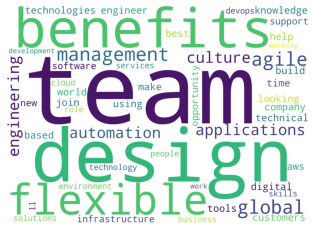

In [55]:
# calling word_cloud for topic 0
word_cloud(0)


Worcloud for topic: 1 



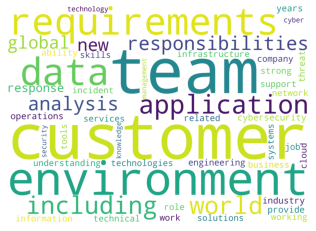

In [56]:
word_cloud(1)


Worcloud for topic: 2 



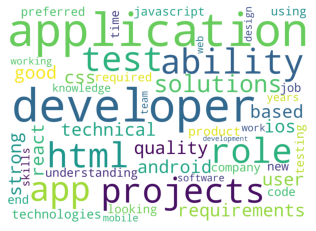

In [57]:
word_cloud(2)


Worcloud for topic: 3 



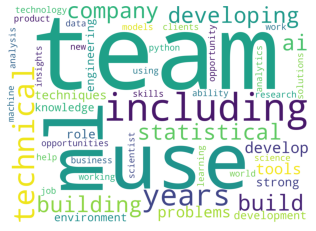

In [58]:
word_cloud(3)


Worcloud for topic: 4 



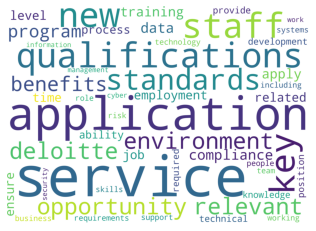

In [59]:
word_cloud(4)

In [60]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


In [61]:
from sklearn.manifold import TSNE
import pyLDAvis.sklearn

In [63]:
pyLDAvis.enable_notebook()
dash = pyLDAvis.sklearn.prepare(lda, cv_fit, cv, mds='tsne')
dash

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:691: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  warnings.warn(


PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
0      150.222153  -72.269554       1        1  26.147832
3       51.163364 -159.968018       2        1  22.491672
2      -73.144554   21.523815       3        1  20.180956
4      -66.410133 -110.606438       4        1  17.727934
1       54.417324   12.443444       5        1  13.451606, topic_info=               Term          Freq         Total Category  logprob  loglift
17195      security  38758.000000  38758.000000  Default  30.0000  30.0000
5551           data  44916.000000  44916.000000  Default  29.0000  29.0000
20888           web  12302.000000  12302.000000  Default  28.0000  28.0000
12543        mobile   9424.000000   9424.000000  Default  27.0000  27.0000
5473          cyber   9815.000000   9815.000000  Default  26.0000  26.0000
...             ...           ...           ...      ...      ...      ...
19095         teams   2101.998781  11400.798141   Topic5  -5.6675   0.3153
4558        company   2109.639150  12988.736469   Topic5  -5.6638   0.1885
18529        strong   2080.198799  11778.506636   Topic5  -5.6779   0.2723
19148  technologies   2009.432655  10446.788599   Topic5  -5.7125   0.3576
16680          role   2068.271163  19458.027767   Topic5  -5.6836  -0.2355

[476 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
0          1  0.019149       00
0          2  0.031564       00
0          3  0.916413       00
0          4  0.023989       00
0          5  0.009048       00
...      ...       ...      ...
21419      1  0.875116  zealand
21419      2  0.003990  zealand
21419      3  0.070488  zealand
21419      4  0.051204  zealand
21433      5  0.997164       zf

[1112 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 3, 5, 2])

---- EXPLICAR LOS RESULTADOS ANTERIORMENTE OBTENIDOS ----

---- DECISIONES TOMADAS EN BASE A ESTOS RESULTADOS ----

In [40]:
#creamos 5 subset divididos según tipo de empleo

#Data Scientist
data_data = data.loc[data['job'] == 'Data Scientist']
print("Tamaño data_data ------>", data_data.shape)

#Web Developer
data_web = data.loc[data['job'] == 'Web Developer']
print("Tamaño data_web ------->", data_web.shape)

#Cyber Security
data_cyber = data.loc[data['job'] == 'Cyber Security']
print("Tamaño data_cyber ----->", data_cyber.shape)

#DevOps
data_devOps = data.loc[data['job'] == 'DevOps']
print("Tamaño data_devOps ---->", data_devOps.shape)

#Mobile Developer
data_mobile = data.loc[data['job'] == 'Mobile Developer']
print("Tamaño data_mobile ---->", data_mobile.shape)

Tamaño data_data ------> (1643, 8)
Tamaño data_web -------> (1434, 8)
Tamaño data_cyber -----> (827, 8)
Tamaño data_devOps ----> (756, 8)
Tamaño data_mobile ----> (659, 8)


DATA SCIENTIST

In [41]:
data_data.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2104,2022,Data Scientist,SOC Analyst Tier 1,59306,Australia,Australia,Position Description: Work for highly performi...,en
2137,2022,Data Scientist,SOC Analyst,99090,Australia,Australia,DXC Technology (NYSE:DXC) - where brilliant pe...,en
2177,2022,Data Scientist,Technology Risk and Compliance Analyst,122654,Australia,Australia,"Date: 28-Jul-2022 Location: Sydney, NSW, AU P...",en
2207,2022,Data Scientist,Junior-Mid Level SOC Analyst,91500,Australia,Australia,Job Purpose: A new opportunity has become ava...,en
2211,2022,Data Scientist,Service Desk Analyst,44104,Canada,Canada,Job Posting: #904432 Position: Service Desk An...,en


In [42]:
data_data["job_summary"]

2104    Position Description: Work for highly performi...
2137    DXC Technology (NYSE:DXC) - where brilliant pe...
2177    Date: 28-Jul-2022  Location: Sydney, NSW, AU P...
2207    Job Purpose:  A new opportunity has become ava...
2211    Job Posting: #904432 Position: Service Desk An...
                              ...                        
8556    Wanted: Accountmanager sales in the NordicsSwe...
8710    StuDocu was founded on the principle that equa...
8728    Salary to £35K D.O.E    This is an urgent requ...
8729     Junior QA Test Engineer  LUSH Global Digital ...
8731     Front End Developer   Javascript, HTML, CSS  ...
Name: job_summary, Length: 1643, dtype: object

DATA SCIENTIS - JOB TITLE

In [43]:
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.stem.porter import *
stemmer = PorterStemmer()
from collections import Counter
import unicodedata
import string

[nltk_data] Downloading package wordnet to /Users/irena/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/irena/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [44]:
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [45]:
from nltk import ngrams
from nltk.probability import FreqDist

In [46]:
def text_to_words(job):

  # convertimos a minúscula y quitamos todo lo que no sea texto o números
  text = re.sub(r"[^a-zA-Z0-9]", " ", job.lower())
  text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
  table = str.maketrans('', '', string.punctuation)

  # tokenizamos - dividimos por espacios
  words = text.split()

  # eliminamos stopwords
  words = [w for w in words if w not in stopwords.words("english")]

  # aplicamos stemming
  # words = [PorterStemmer().stem(w) for w in words]
  
  # prueba Lemmatizer
  lemmatizer = WordNetLemmatizer()
  words = [lemmatizer.lemmatize(w).strip() for w in words]
    
  return words

# aplicamos
all_job = list(map(text_to_words, data_data["job_title"]))
join_words_data = [word for innerList in all_job for word in innerList]

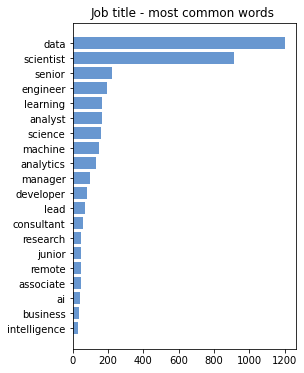

In [47]:
plt.figure(figsize=(4, 6))

wf = Counter(join_words_data)

wf_most_common = wf.most_common(20)
words = [w[0] for w in wf_most_common]
freqs = [w[1] for w in wf_most_common]
freqs, words = zip(*sorted(zip(freqs, words)))

plt.barh(words, freqs, color = "#6897d0")
plt.title("Job title - most common words ")
plt.show()


In [48]:
data_data.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2104,2022,Data Scientist,SOC Analyst Tier 1,59306,Australia,Australia,Position Description: Work for highly performi...,en
2137,2022,Data Scientist,SOC Analyst,99090,Australia,Australia,DXC Technology (NYSE:DXC) - where brilliant pe...,en
2177,2022,Data Scientist,Technology Risk and Compliance Analyst,122654,Australia,Australia,"Date: 28-Jul-2022 Location: Sydney, NSW, AU P...",en
2207,2022,Data Scientist,Junior-Mid Level SOC Analyst,91500,Australia,Australia,Job Purpose: A new opportunity has become ava...,en
2211,2022,Data Scientist,Service Desk Analyst,44104,Canada,Canada,Job Posting: #904432 Position: Service Desk An...,en


DATA SCIENTIST - JOB SUMMARY - KEYWORDS

In [49]:
#!python -m spacy download en_core_web_sm
import spacy
from spacy import displacy
from IPython.display import HTML, display
# change the model to en_core_web_sm/lg for english
nlp = spacy.load('en_core_web_sm')

text= data_data.iloc[0,6]

def extract_noun_phrase_experience(doc):
    a=[]
    for np in doc.noun_chunks:
        a.append(str(np))
    return " ".join(a)
doc = nlp(text)
a= extract_noun_phrase_experience(doc)
#a

In [50]:
#data_data['yaked_summary'] = data_data['yaked_summary'].apply(lambda x: x.split())

In [51]:
import yake
import swifter
from nltk.tokenize import RegexpTokenizer
def keywords_yake(text):
    st = set(stopwords.words('english'))
    # take keywords for each post & turn them into a text string "sentence"
  # simple_kwextractor = yake.KeywordExtractor(lan='EN',
  #                                  n=1, 
  #                                  dedupLim=.99, 
  #                                  dedupFunc='seqm', 
  #                                  windowsSize=100, 
  #                                  top=100, 
  #                                  features=None,
  #                                 stopwords=st)
    
    max_ngram_size = 2
    deduplication_thresold = 0.9
    deduplication_algo = 'seqm'
    windowSize = 150
    numOfKeywords = 20
    
    simple_kwextractor = yake.KeywordExtractor(lan='EN',
                                 n=max_ngram_size, 
                                 dedupLim=deduplication_thresold, 
                                 dedupFunc=deduplication_algo, 
                                 windowsSize=windowSize, 
                                 top=numOfKeywords, 
                                 features=None,
                                 stopwords=st)
    
    # create empty list to save our "sentnecs" to
    post_keywords = simple_kwextractor.extract_keywords(text)
    sentence_output = ""
    for word, number in post_keywords:
        sentence_output += word + " " 
    return(sentence_output)
  
data_data['yaked_summary_1']=data_data['job_summary'].swifter.apply(lambda x: keywords_yake(x)) 

Pandas Apply: 100%|██████████| 1643/1643 [03:32<00:00,  7.73it/s]
/var/folders/3z/343f53t53zq9pj_l_rd_kmy00000gn/T/ipykernel_65297/3173239438.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_data['yaked_summary_1']=data_data['job_summary'].swifter.apply(lambda x: keywords_yake(x))


In [52]:
#data_data['yaked_summary_1'] = data_data['yaked_summary_1'].apply(lambda x: x.split())
#data_data['yaked_summary_1']

In [53]:
def text_to_words(job):

  punc= string.punctuation

  # convertimos a minúscula y quitamos todo lo que no sea texto o números
  text = job.lower()
  text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
  table = str.maketrans('', '', string.punctuation)

  # is digit
  text = ''.join([i for i in text if not i.isdigit()])  

  #removeattachedsymbols
  a = text
  for i in punc:
    a = " ".join([word.replace(i, '') for word in str(a).split()])      

  # tokenizamos - dividimos por espacios
  words = a.split()

  # eliminamos stopwords
  words = [w for w in words if w not in stopwords.words("english")]

  # aplicamos stemming
  # words = [PorterStemmer().stem(w) for w in words]
  
  # prueba Lemmatizer
  lemmatizer = WordNetLemmatizer()
  words = [lemmatizer.lemmatize(w).strip() for w in words]
    
  return words

In [54]:
# aplicamos
a1 = list(map(text_to_words, data_data["yaked_summary_1"]))
b1 = [word for innerList in a1 for word in innerList]

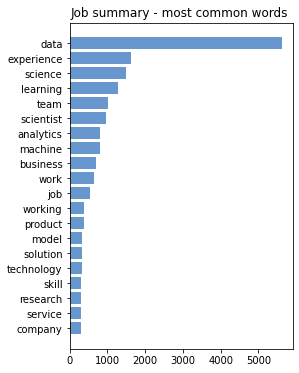

In [55]:
plt.figure(figsize=(4, 6))

wf = Counter(b1)

wf_most_common = wf.most_common(20)
words = [w[0] for w in wf_most_common]
freqs = [w[1] for w in wf_most_common]
freqs, words = zip(*sorted(zip(freqs, words)))

plt.barh(words, freqs, color = "#6897d0")
plt.title("Job summary - most common words ")
plt.show()

In [56]:
# remove 20 most common words

# new stopwords list
stop_word_list = []
for most in wf.most_common(20):
    stop_word_list.append(most[0])

# eliminamos stopwords, 20 most common
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stop_word_list]
  return words

new_list_summary = stop_words(b1)
#new_join_symmary = [word for innerList in new_list_summary for word in innerList]

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

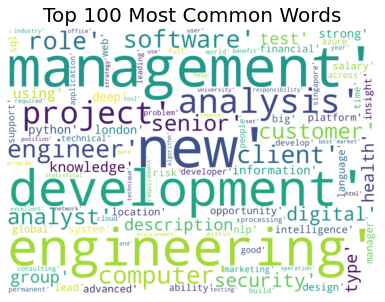

In [57]:
mostcommon = FreqDist(new_list_summary).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [58]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

#print(lista_100)

In [59]:
print(lista_100)

['management', 'new', 'engineering', 'development', 'analysis', 'project', 'engineer', 'role', 'software', 'computer', 'client', 'customer', 'senior', 'analyst', 'security', 'digital', 'description', 'group', 'test', 'health', 'type', 'knowledge', 'using', 'information', 'deep', 'strong', 'python', 'london', 'intelligence', 'global', 'salary', 'platform', 'system', 'location', 'lead', 'opportunity', 'manager', 'nlp', 'design', 'risk', 'financial', 'advanced', 'language', 'insight', 'web', 'sql', 'big', 'ability', 'support', 'time', 'developer', 'marketing', 'technical', 'azure', 'across', 'good', 'develop', 'people', 'problem', 'leading', 'application', 'singapore', 'build', 'processing', 'world', 'cloud', 'full', 'permanent', 'consulting', 'requirement', 'year', 'within', 'responsibility', 'use', 'industry', 'market', 'university', 'date', 'testing', 'end', 'help', 'statistical', 'best', 'technique', 'set', 'operation', 'benefit', 'position', 'environment', 'required', 'user', 'html',

In [60]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['analysis', 'security', 'health', 'deep', 'python', 'intelligence', 'platform', 'nlp', 'design', 'financial',
                'sql', 'big', 'marketing', 'azure', 'cloud', 'university', 'testing', 'statistical']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_1 = stop_words(new_list_summary)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

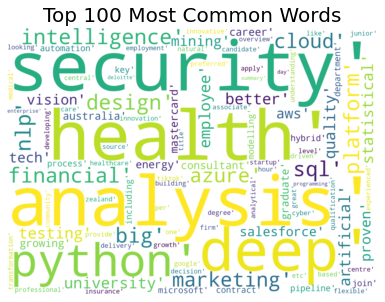

In [61]:
mostcommon = FreqDist(new_list_summary_1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [62]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

In [63]:
print(lista_100)

['analysis', 'security', 'health', 'deep', 'python', 'intelligence', 'platform', 'nlp', 'design', 'financial', 'sql', 'big', 'marketing', 'azure', 'cloud', 'university', 'testing', 'statistical', 'employee', 'quality', 'artificial', 'better', 'mining', 'vision', 'aws', 'tech', 'proven', 'salesforce', 'growing', 'energy', 'graduate', 'australia', 'consultant', 'career', 'mastercard', 'pipeline', 'process', 'modelling', 'join', 'contract', 'automation', 'including', 'department', 'hybrid', 'key', 'microsoft', 'professional', 'per', 'employment', 'insurance', 'apply', 'firm', 'source', 'google', 'great', 'preferred', 'qualification', 'decision', 'overview', 'like', 'level', 'etc', 'delivery', 'zealand', 'analytical', 'associate', 'transformation', 'tiktok', 'community', 'understanding', 'title', 'innovative', 'flexible', 'building', 'candidate', 'central', 'healthcare', 'innovation', 'degree', 'provide', 'based', 'junior', 'centre', 'growth', 'driven', 'cyber', 'developing', 'startup', 'l

In [64]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['security', 'health', 'deep', 'python', 'intelligence', 'platform', 'nlp', 'design', 'financial', 'sql', 'big', 'marketing', 'azure', 'cloud', 'university', 
                'testing', 'statistical', 'artificial', 'mining', 'aws', 'salesforce', 'graduate', 'consultant', 'career', 'mastercard', 'contract', 'microsoft', 'professional', 
                'insurance', 'google', 'qualification', 'analytical', 'flexible', 'healthcare', 'degree', 'cyber', 'experienced', 'medical', 'natural', 'care', 'programming']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_2 = stop_words(new_list_summary_1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

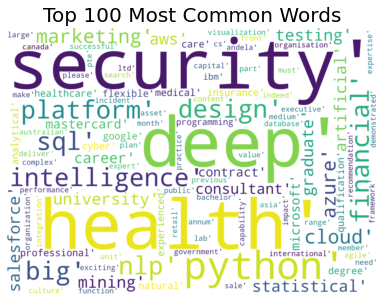

In [65]:
mostcommon = FreqDist(new_list_summary_2).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [66]:
print(mostcommon)

[('security', 194), ('health', 172), ('deep', 157), ('python', 155), ('intelligence', 147), ('platform', 135), ('nlp', 122), ('design', 121), ('financial', 120), ('sql', 115), ('big', 115), ('marketing', 105), ('azure', 102), ('cloud', 85), ('university', 79), ('testing', 77), ('statistical', 76), ('artificial', 60), ('mining', 58), ('aws', 56), ('salesforce', 55), ('graduate', 53), ('consultant', 52), ('career', 52), ('mastercard', 52), ('contract', 50), ('microsoft', 49), ('professional', 49), ('insurance', 48), ('google', 48), ('qualification', 47), ('analytical', 45), ('flexible', 43), ('healthcare', 42), ('degree', 41), ('cyber', 39), ('experienced', 38), ('medical', 38), ('natural', 38), ('care', 38), ('programming', 38), ('ibm', 37), ('organisation', 37), ('visualization', 37), ('indeed', 37), ('deliver', 36), ('asia', 36), ('incident', 36), ('sale', 36), ('unit', 36), ('canada', 36), ('agile', 36), ('member', 35), ('performance', 35), ('medium', 35), ('lab', 35), ('complex', 35

In [67]:
#lista de palabras claves por tipología

data_tools = ['python', 'google', 'sql','azure', 'cloud', ' r ', 'salesforce', 'aws', ' scala ']
data_skills = ['nlp', 'artificial intelligence', 'design', 'financial', 'big data', 'consulting', 'testing', 'data minning', 'machine learning', 'statistic']
data_education = ['qualification', 'bachelor degree', 'engineer', "master", "phd science"]
data_benefits = ['health', 'remote', 'mastercard', 'life assurance', 'pension', 'flexible working', "holiday" ]

WEB DEVELOPER - JOB SUMMARY - KEYWORDS

In [68]:
data_web.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2593,2022,Web Developer,"SQL DEVELOPER WITH Exp In R, SAS, T-SQL",1200000,Mexico,Mexico,ABOUT THE ROLE(This position is to move to USA...,en
2598,2022,Web Developer,Embedded Linux Software Developer - 100% Remot...,936000,Mexico,Mexico,Essential Functions: · Develop application sof...,en
2732,2022,Web Developer,Lead Developer,79500,New Zealand,New Zealand,We are seeking a highly capable Lead Developer...,en
3987,2022,Web Developer,Power Platforms Developer,111125,New Zealand,New Zealand,20987BR Requisition Number: 20987BR Descriptio...,en
4001,2022,Web Developer,Senior Developer,126762,New Zealand,New Zealand,Leaven is the Cloud Transformation Business Un...,en


In [69]:
from nltk.corpus import stopwords
nltk.download("stopwords")
st = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [70]:
import yake
import swifter
from nltk.tokenize import RegexpTokenizer
def keywords_yake(text):
    
    # take keywords for each post & turn them into a text string "sentence"
  # simple_kwextractor = yake.KeywordExtractor(lan='EN',
  #                                  n=1, 
  #                                  dedupLim=.99, 
  #                                  dedupFunc='seqm', 
  #                                  windowsSize=100, 
  #                                  top=100, 
  #                                  features=None,
  #                                 stopwords=st)
    
    max_ngram_size = 2
    deduplication_thresold = 0.9
    deduplication_algo = 'seqm'
    windowSize = 150
    numOfKeywords = 20
    
    simple_kwextractor = yake.KeywordExtractor(lan='EN',
                                 n=max_ngram_size, 
                                 dedupLim=deduplication_thresold, 
                                 dedupFunc=deduplication_algo, 
                                 windowsSize=windowSize, 
                                 top=numOfKeywords, 
                                 features=None,
                                 stopwords=stopwords.words("english"))
    
    # create empty list to save our "sentnecs" to
    post_keywords = simple_kwextractor.extract_keywords(text)
    sentence_output = ""
    for word, number in post_keywords:
        sentence_output += word + " " 
    return(sentence_output)
  
data_web['yaked_summary_1']=data_web['job_summary'].swifter.apply(lambda x: keywords_yake(x)) 

Pandas Apply: 100%|██████████| 1434/1434 [02:49<00:00,  8.46it/s]
/var/folders/3z/343f53t53zq9pj_l_rd_kmy00000gn/T/ipykernel_65297/2214043647.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_web['yaked_summary_1']=data_web['job_summary'].swifter.apply(lambda x: keywords_yake(x))


In [71]:
a1 = list(map(text_to_words, data_web["yaked_summary_1"]))
b1 = [word for innerList in a1 for word in innerList]

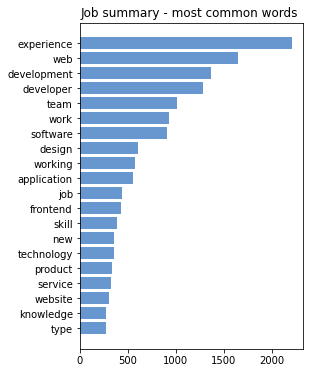

In [72]:
plt.figure(figsize=(4, 6))

wf = Counter(b1)

wf_most_common = wf.most_common(20)
words = [w[0] for w in wf_most_common]
freqs = [w[1] for w in wf_most_common]
freqs, words = zip(*sorted(zip(freqs, words)))

plt.barh(words, freqs, color = "#6897d0")
plt.title("Job summary - most common words ")
plt.show()

In [73]:
# remove 20 most common words

# new stopwords list
stop_word_list = []
for most in wf.most_common(20):
    stop_word_list.append(most[0])

# eliminamos stopwords, 20 most common
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stop_word_list]
  return words

new_list_summary = stop_words(b1)
#new_join_symmary = [word for innerList in new_list_summary for word in innerList]

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

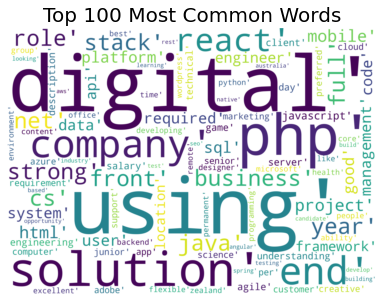

In [74]:
mostcommon = FreqDist(new_list_summary).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [75]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['digital', 'using', 'php', 'solution', 'company', 'end', 'react', 'strong', 'stack', 'business', 'year', 'cs', 'net', 'front', 'java', 'full', 'role', 'project', 'mobile', 'html', 'platform', 'sql', 'good', 'user', 'required', 'data', 'code', 'management', 'system', 'engineer', 'api', 'framework', 'location', 'javascript', 'engineering', 'game', 'description', 'salary', 'server', 'agile', 'client', 'understanding', 'technical', 'day', 'requirement', 'azure', 'science', 'senior', 'computer', 'marketing', 'per', 'preferred', 'customer', 'cloud', 'creative', 'app', 'junior', 'support', 'adobe', 'developing', 'flexible', 'python', 'backend', 'best', 'programming', 'ability', 'time', 'environment', 'office', 'excellent', 'wordpress', 'permanent', 'designer', 'remote', 'people', 'like', 'zealand', 'microsoft', 'health', 'group', 'content', 'core', 'opportunity', 'building', 'australia', 'based', 'candidate', 'build', 'aws', 'looking', 'rest', 'angular', 'learning', 'seo', 'native', 'test', 

In [76]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['php', 'react', 'css', 'mobile', 'html', 'sql', 'engineer', 'api', 'javascript', 'engineer', 'game', 'agile', 'azure', 'cloud', 'creative', 'adobe', 'python', 
                'wordpress', 'design', 'remote', 'microsoft', 'health', 'aws', 'rest', 'angular', 'seo', 'testing']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_1 = stop_words(new_list_summary)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

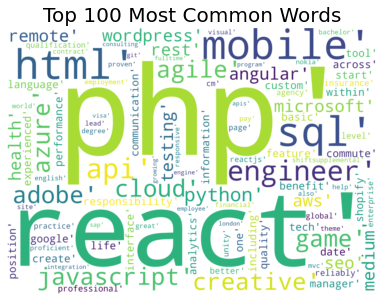

In [77]:
mostcommon = FreqDist(new_list_summary_1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [78]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['php', 'react', 'mobile', 'html', 'sql', 'engineer', 'api', 'javascript', 'game', 'agile', 'azure', 'cloud', 'creative', 'adobe', 'python', 'wordpress', 'remote', 'microsoft', 'health', 'aws', 'rest', 'angular', 'seo', 'testing', 'medium', 'responsibility', 'tech', 'one', 'custom', 'within', 'benefit', 'across', 'manager', 'date', 'communication', 'language', 'information', 'google', 'create', 'start', 'experienced', 'tool', 'commute', 'including', 'position', 'basic', 'feature', 'performance', 'interface', 'shopify', 'quality', 'life', 'analytics', 'professional', 'better', 'reliably', 'level', 'insurance', 'qualification', 'practice', 'page', 'unity', 'global', 'cm', 'agency', 'reactjs', 'enterprise', 'shiftsupplemental', 'employment', 'proven', 'contract', 'pay', 'nokia', 'english', 'world', 'visual', 'help', 'proficient', 'site', 'lead', 'financial', 'great', 'responsive', 'theme', 'mvc', 'bachelor', 'degree', 'also', 'integration', 'consulting', 'engine', 'git', 'growing', 'apis'

In [79]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['php', 'react', 'html', 'sql', 'engineer', 'api', 'javascript', 'game', 'agile', 'azure', 'cloud', 'creative', 'adobe', 'python', 'wordpress', 'remote', 'microsoft', 
                'health', 'aws', 'rest', 'angular', 'seo', 'testing', 'communication', 'shopify', 'quality', 'analytics', 'professional', 'insurance', 'qualification', 'reactjs', 
                'shiftsupplemental', 'contract', 'english', 'financial', 'mvc', 'bachelor', 'git', 'fulltime', 'degree', 'consulting']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_2 = stop_words(new_list_summary_1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:520: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  Image.ROTATE_90)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/

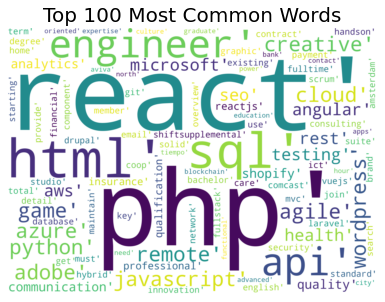

In [80]:
mostcommon = FreqDist(new_list_summary_2).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [81]:
print(mostcommon)

[('php', 266), ('react', 219), ('html', 154), ('sql', 149), ('engineer', 132), ('api', 132), ('javascript', 130), ('game', 127), ('agile', 118), ('azure', 110), ('cloud', 100), ('creative', 97), ('adobe', 95), ('python', 92), ('wordpress', 83), ('remote', 81), ('microsoft', 79), ('health', 79), ('aws', 69), ('rest', 67), ('angular', 67), ('seo', 67), ('testing', 63), ('communication', 57), ('shopify', 50), ('quality', 49), ('analytics', 49), ('professional', 49), ('insurance', 47), ('qualification', 47), ('reactjs', 44), ('shiftsupplemental', 44), ('contract', 44), ('english', 43), ('financial', 41), ('mvc', 39), ('bachelor', 39), ('degree', 39), ('consulting', 38), ('git', 38), ('fulltime', 37), ('database', 35), ('graphic', 35), ('provide', 35), ('member', 35), ('home', 35), ('existing', 34), ('use', 34), ('security', 33), ('get', 33), ('drupal', 33), ('innovation', 32), ('detail', 32), ('payment', 32), ('care', 32), ('studio', 32), ('term', 32), ('coop', 32), ('comcast', 32), ('amst

In [82]:
#lista de palabras claves por tipología

web_tools = ["node", 'php', 'google', 'html', 'sql', 'javascript', 'agile', 'azure', 'cloud', 'adobe', 'python', 'wordpress', 'microsoft', 'aws', 'rest', 'angular', 'seo', 'shopify', 'react', 'git', 'vuejs']
web_skills = ['api', 'agile', 'creative', 'testing', 'quality', 'quality', 'english', 'graphic', 'fullstack', 'scrum', 'blockchain', 'design']
web_education = ['qualification', 'bachelor degree', 'engineer', 'graduate']
web_benefits = ['health', 'remote', 'mastercard']

CYBER SECURITY - JOB SUMMARY - KEYWORDS

In [83]:
data_cyber.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2099,2022,Cyber Security,Security Advisor,110107,Australia,Australia,Trustwave is a leading cybersecurity and manag...,en
2100,2022,Cyber Security,Cyber Security,140000,Australia,Australia,About the job: What makes Cognizant a unique p...,en
2102,2022,Cyber Security,Information Security Officer/Cyber Security Sp...,141902,Australia,Australia,Posted: 16/08/2022Closing Date: 15/09/2022Job ...,en
2103,2022,Cyber Security,Penetration Tester / Cyber Security Specialist,86848,Australia,Australia,IT & Telecomms IT Security Sydney Permanent / ...,en
2105,2022,Cyber Security,Cyber Security Auditor,69625,Australia,Australia,Company Description We are SGS – the world’s l...,en


In [84]:
from nltk.corpus import stopwords
nltk.download("stopwords")
st = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [85]:
import yake
import swifter
from nltk.tokenize import RegexpTokenizer
def keywords_yake(text):
    
    # take keywords for each post & turn them into a text string "sentence"
  # simple_kwextractor = yake.KeywordExtractor(lan='EN',
  #                                  n=1, 
  #                                  dedupLim=.99, 
  #                                  dedupFunc='seqm', 
  #                                  windowsSize=100, 
  #                                  top=100, 
  #                                  features=None,
  #                                 stopwords=st)
    
    max_ngram_size = 2
    deduplication_thresold = 0.9
    deduplication_algo = 'seqm'
    windowSize = 150
    numOfKeywords = 20
    
    simple_kwextractor = yake.KeywordExtractor(lan='EN',
                                 n=max_ngram_size, 
                                 dedupLim=deduplication_thresold, 
                                 dedupFunc=deduplication_algo, 
                                 windowsSize=windowSize, 
                                 top=numOfKeywords, 
                                 features=None,
                                 stopwords=stopwords.words("english"))
    
    # create empty list to save our "sentnecs" to
    post_keywords = simple_kwextractor.extract_keywords(text)
    sentence_output = ""
    for word, number in post_keywords:
        sentence_output += word + " " 
    return(sentence_output)
  
data_cyber['yaked_summary_1']=data_cyber['job_summary'].swifter.apply(lambda x: keywords_yake(x)) 

Pandas Apply: 100%|██████████| 827/827 [02:16<00:00,  6.08it/s]
/var/folders/3z/343f53t53zq9pj_l_rd_kmy00000gn/T/ipykernel_65297/2532475490.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cyber['yaked_summary_1']=data_cyber['job_summary'].swifter.apply(lambda x: keywords_yake(x))


In [86]:
a1 = list(map(text_to_words, data_cyber["yaked_summary_1"]))
b1 = [word for innerList in a1 for word in innerList]

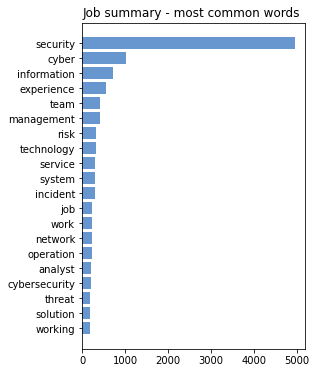

In [87]:
plt.figure(figsize=(4, 6))

wf = Counter(b1)

wf_most_common = wf.most_common(20)
words = [w[0] for w in wf_most_common]
freqs = [w[1] for w in wf_most_common]
freqs, words = zip(*sorted(zip(freqs, words)))

plt.barh(words, freqs, color = "#6897d0")
plt.title("Job summary - most common words ")
plt.show()

In [88]:
# remove 20 most common words

# new stopwords list
stop_word_list = []
for most in wf.most_common(20):
    stop_word_list.append(most[0])

# eliminamos stopwords, 20 most common
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stop_word_list]
  return words

new_list_summary = stop_words(b1)
#new_join_symmary = [word for innerList in new_list_summary for word in innerList]

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

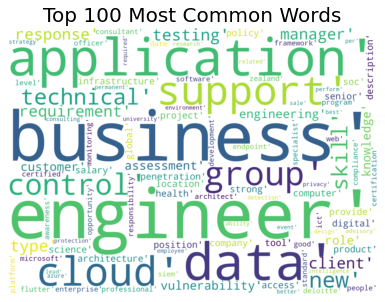

In [89]:
mostcommon = FreqDist(new_list_summary).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [90]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['business', 'engineer', 'application', 'data', 'support', 'cloud', 'group', 'control', 'technical', 'skill', 'new', 'testing', 'type', 'requirement', 'response', 'manager', 'client', 'vulnerability', 'customer', 'role', 'engineering', 'knowledge', 'assessment', 'infrastructure', 'position', 'digital', 'penetration', 'global', 'strong', 'health', 'access', 'project', 'senior', 'provide', 'computer', 'tool', 'policy', 'company', 'product', 'location', 'architecture', 'soc', 'science', 'description', 'salary', 'enterprise', 'good', 'program', 'flutter', 'professional', 'date', 'siem', 'consultant', 'certified', 'endpoint', 'responsibility', 'compliance', 'development', 'officer', 'framework', 'monitoring', 'deloitte', 'standard', 'opportunity', 'architect', 'specialist', 'web', 'zealand', 'certification', 'ict', 'microsoft', 'level', 'platform', 'awareness', 'software', 'people', 'intelligence', 'sale', 'consulting', 'related', 'ability', 'university', 'lead', 'event', 'privacy', 'strate

In [91]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['business', 'engineer', 'application', 'data', 'support', 'cloud', 'testing', 'health', 'policy', 'architecture', 'flutter', 'certified', 
                'architect', 'specialist', 'certification', 'microsoft', 'intelligence', 'sale', 'consulting', 'university', 'permanent', 'design', 'azure']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_1 = stop_words(new_list_summary)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

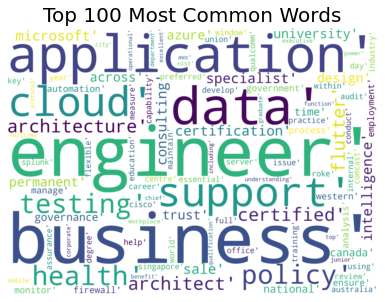

In [92]:
mostcommon = FreqDist(new_list_summary_1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [93]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['business', 'engineer', 'application', 'data', 'support', 'cloud', 'testing', 'health', 'policy', 'architecture', 'flutter', 'certified', 'architect', 'specialist', 'certification', 'microsoft', 'intelligence', 'sale', 'consulting', 'university', 'permanent', 'design', 'azure', 'across', 'trust', 'governance', 'national', 'canada', 'time', 'government', 'western', 'monitor', 'firewall', 'process', 'automation', 'employment', 'analysis', 'ensure', 'manage', 'singapore', 'maintain', 'audit', 'help', 'preferred', 'cisco', 'window', 'essential', 'centre', 'key', 'practice', 'day', 'develop', 'using', 'office', 'internal', 'conduct', 'world', 'australia', 'full', 'career', 'issue', 'flexible', 'education', 'industry', 'training', 'assurance', 'year', 'measure', 'splunk', 'degree', 'qualcomm', 'comcast', 'union', 'within', 'capability', 'server', 'roke', 'review', 'workplace', 'understanding', 'qualification', 'chief', 'benefit', 'nist', 'city', 'excellent', 'junior', 'operational', 'includ

In [94]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['business', 'engineer', 'application', 'data', 'support', 'cloud', 'testing', 'health', 'policy', 'architecture', 'flutter', 'certified', 'architect', 'specialist', 
                'certification', 'microsoft', 'intelligence', 'sale', 'consulting', 'university', 'permanent', 'design', 'azure', 'governance', 'firewall', 'automation', 'analysis', 
                'ensure', 'flexible', 'splunk', 'degree', 'qualification', 'operational', 'including', 'protocol', 'aws', 'graduate', 'fulltime']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_2 = stop_words(new_list_summary_1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

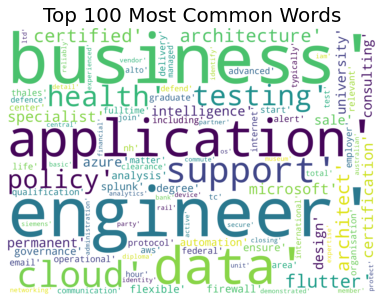

In [95]:
mostcommon = FreqDist(new_list_summary_2).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [96]:
print(mostcommon)

[('business', 169), ('engineer', 164), ('application', 158), ('data', 151), ('support', 145), ('cloud', 144), ('testing', 105), ('health', 73), ('policy', 66), ('architecture', 64), ('flutter', 55), ('certified', 50), ('architect', 44), ('specialist', 43), ('certification', 42), ('microsoft', 42), ('intelligence', 39), ('sale', 39), ('consulting', 37), ('university', 37), ('permanent', 35), ('design', 33), ('azure', 32), ('governance', 31), ('firewall', 29), ('automation', 29), ('analysis', 29), ('ensure', 29), ('flexible', 23), ('splunk', 23), ('degree', 23), ('qualification', 21), ('operational', 20), ('including', 20), ('protocol', 20), ('aws', 19), ('graduate', 19), ('fulltime', 19), ('area', 19), ('nh', 19), ('matter', 18), ('organisation', 18), ('advanced', 18), ('thales', 18), ('relevant', 18), ('alert', 18), ('employer', 18), ('center', 18), ('life', 18), ('federal', 18), ('internet', 18), ('email', 18), ('start', 18), ('delivery', 18), ('communication', 17), ('alto', 17), ('in

In [97]:
#lista de palabras claves por tipología

cyber_tools = ['cloud', 'flutter', 'microsoft', 'aws', 'splunk', 'azure']
cyber_skills = ['testing', 'architecture', 'architect', 'consulting', 'governance', 'bank']
cyber_education = ['engineer', 'certified', 'certification', 'degree', 'graduate']
cyber_benefits = ['health']

DEVOPS - JOB SUMMARY - KEYWORDS

In [98]:
data_devOps.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2101,2022,DevOps,Graduate Security Systems Engineer,55000,Australia,Australia,"Have you studied Mechatronic, Electrical or In...",en
2148,2022,DevOps,Cyber Security Systems Engineer ISSE,142180,Australia,Australia,We help the world run better Our company cultu...,en
2160,2022,DevOps,Cyber Security Systems Analyst,87474,Australia,Australia,The Opportunity We are looking for a Cyber Se...,en
2173,2022,DevOps,Security Systems Engineers ﻿,116842,Australia,Australia,"About us Saab Australia is a defence, security...",en
2197,2022,DevOps,Cloud & Cyber Security Professionals| Join Can...,220000,Australia,Australia,Cloud & Cyber Security Engineers / Architects ...,en


In [99]:
from nltk.corpus import stopwords
nltk.download("stopwords")
st = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [100]:
import yake
import swifter
from nltk.tokenize import RegexpTokenizer
def keywords_yake(text):
    st = set(stopwords.words('english'))
    # take keywords for each post & turn them into a text string "sentence"
  # simple_kwextractor = yake.KeywordExtractor(lan='EN',
  #                                  n=1, 
  #                                  dedupLim=.99, 
  #                                  dedupFunc='seqm', 
  #                                  windowsSize=100, 
  #                                  top=100, 
  #                                  features=None,
  #                                 stopwords=st)
    
    max_ngram_size = 2
    deduplication_thresold = 0.9
    deduplication_algo = 'seqm'
    windowSize = 150
    numOfKeywords = 20
    
    simple_kwextractor = yake.KeywordExtractor(lan='EN',
                                 n=max_ngram_size, 
                                 dedupLim=deduplication_thresold, 
                                 dedupFunc=deduplication_algo, 
                                 windowsSize=windowSize, 
                                 top=numOfKeywords, 
                                 features=None,
                                 stopwords=st)
    
    # create empty list to save our "sentnecs" to
    post_keywords = simple_kwextractor.extract_keywords(text)
    sentence_output = ""
    for word, number in post_keywords:
        sentence_output += word + " " 
    return(sentence_output)
  
data_devOps['yaked_summary_1']=data_devOps['job_summary'].swifter.apply(lambda x: keywords_yake(x)) 

Pandas Apply: 100%|██████████| 756/756 [01:50<00:00,  6.85it/s]
/var/folders/3z/343f53t53zq9pj_l_rd_kmy00000gn/T/ipykernel_65297/25737311.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_devOps['yaked_summary_1']=data_devOps['job_summary'].swifter.apply(lambda x: keywords_yake(x))


In [101]:
a1 = list(map(text_to_words, data_devOps["yaked_summary_1"]))
b1 = [word for innerList in a1 for word in innerList]

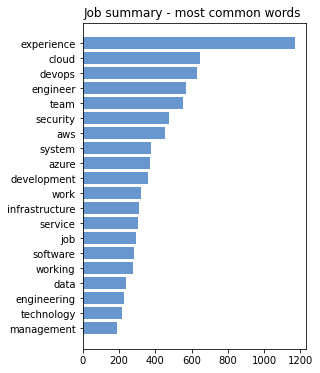

In [102]:
plt.figure(figsize=(4, 6))

wf = Counter(b1)

wf_most_common = wf.most_common(20)
words = [w[0] for w in wf_most_common]
freqs = [w[1] for w in wf_most_common]
freqs, words = zip(*sorted(zip(freqs, words)))

plt.barh(words, freqs, color = "#6897d0")
plt.title("Job summary - most common words ")
plt.show()

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

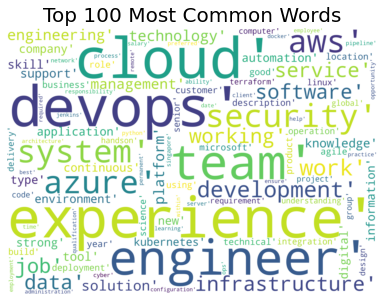

In [103]:
mostcommon = FreqDist(b1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [104]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['experience', 'cloud', 'devops', 'engineer', 'team', 'security', 'aws', 'system', 'azure', 'development', 'work', 'infrastructure', 'service', 'job', 'software', 'working', 'data', 'engineering', 'technology', 'management', 'solution', 'platform', 'knowledge', 'tool', 'skill', 'support', 'application', 'automation', 'strong', 'environment', 'new', 'company', 'type', 'continuous', 'information', 'digital', 'kubernetes', 'description', 'business', 'science', 'deployment', 'good', 'product', 'location', 'role', 'technical', 'customer', 'microsoft', 'agile', 'year', 'operation', 'using', 'build', 'senior', 'integration', 'linux', 'delivery', 'requirement', 'group', 'understanding', 'terraform', 'code', 'design', 'computer', 'project', 'handson', 'global', 'responsibility', 'pipeline', 'opportunity', 'cyber', 'network', 'server', 'process', 'ability', 'python', 'client', 'ops', 'time', 'singapore', 'configuration', 'best', 'employee', 'practice', 'required', 'learning', 'preferred', 'date'

In [105]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['cloud', 'engineer', 'security', 'aws', 'system', 'azure', 'infrastructure', 'service', 'data', 'automation', 'kubernetes', 'science', 'microsoft', 'agile', 
                'integration', 'linux', 'pipeline', 'opportunity', 'cyber', 'server', 'python', 'client', 'ops', 'remote', 'ensure', 'docker', 'architecture', 'permanent', 
                'qualification', 'jenkins', 'administration']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_1 = stop_words(b1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

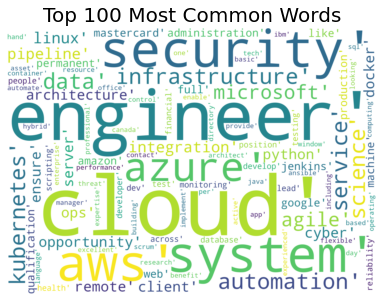

In [106]:
mostcommon = FreqDist(new_list_summary_1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [107]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['cloud', 'engineer', 'security', 'aws', 'system', 'azure', 'infrastructure', 'service', 'data', 'automation', 'kubernetes', 'science', 'microsoft', 'agile', 'integration', 'linux', 'pipeline', 'opportunity', 'cyber', 'server', 'python', 'client', 'ops', 'remote', 'ensure', 'docker', 'architecture', 'permanent', 'qualification', 'jenkins', 'administration', 'full', 'mastercard', 'like', 'machine', 'amazon', 'web', 'production', 'google', 'monitoring', 'position', 'dev', 'health', 'reliability', 'test', 'database', 'lead', 'scripting', 'develop', 'financial', 'across', 'developer', 'testing', 'people', 'performance', 'window', 'threat', 'enable', 'professional', 'expertise', 'implement', 'per', 'including', 'benefit', 'tech', 'architect', 'asset', 'day', 'operating', 'canada', 'manager', 'java', 'one', 'research', 'provide', 'control', 'based', 'hybrid', 'sql', 'enterprise', 'ansible', 'active', 'office', 'scrum', 'experienced', 'excellent', 'ibm', 'looking', 'basic', 'computing', 'reso

In [108]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['cloud', 'engineer', 'security', 'aws', 'system', 'azure', 'infrastructure', 'service', 'data', 'automation', 'kubernetes', 'science', 'microsoft', 'agile', 
                'integration', 'linux', 'pipeline', 'opportunity', 'cyber', 'server', 'python', 'ops', 'remote', 'ensure', 'docker', 'architecture', 'permanent', 'qualification', 
                'jenkins', 'mastercard', 'amazon', 'google', 'monitoring', 'health', 'testing', 'database', 'scripting', 'java', 'hybrid', 'sql', 'scrum', 'container', 'flexible']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_2 = stop_words(new_list_summary_1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

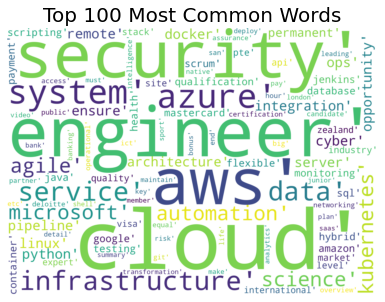

In [109]:
mostcommon = FreqDist(new_list_summary_2).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [110]:
print(mostcommon)

[('cloud', 647), ('engineer', 572), ('security', 476), ('aws', 451), ('system', 374), ('azure', 370), ('infrastructure', 310), ('service', 304), ('data', 240), ('automation', 139), ('kubernetes', 103), ('science', 93), ('microsoft', 75), ('agile', 73), ('integration', 66), ('linux', 65), ('pipeline', 52), ('opportunity', 52), ('cyber', 51), ('server', 51), ('python', 48), ('ops', 48), ('remote', 42), ('ensure', 40), ('docker', 39), ('architecture', 38), ('permanent', 37), ('qualification', 37), ('jenkins', 37), ('mastercard', 36), ('amazon', 35), ('google', 35), ('monitoring', 33), ('health', 33), ('database', 32), ('scripting', 32), ('testing', 31), ('java', 26), ('hybrid', 25), ('sql', 25), ('scrum', 24), ('container', 22), ('flexible', 22), ('payment', 22), ('industry', 21), ('api', 21), ('market', 21), ('stack', 21), ('quality', 21), ('site', 21), ('level', 21), ('pte', 21), ('international', 20), ('expert', 20), ('zealand', 20), ('visa', 20), ('networking', 20), ('big', 20), ('equ

In [111]:
#lista de palabras claves por tipología

devOps_tools = ['cloud', 'aws','azure', 'kubernetes','microsoft', 'linux', 'python', 'java', 'sql', 'docker']
devOps_skills = ['system','automation', 'agile', 'integration', 'ops', 'scripting', 'testing', 'container', 'science']
devOps_education = ['engineer',]
devOps_benefits = ['remote', 'health', 'flexible', ]

MOBILE - JOB SUMMARY - KEYWORDS

In [112]:
data_mobile.head()

,work_year,job,job_title,salary,employee_residence,company_location,job_summary,language
2169,2022,Mobile Developer,Application Security Manager,112000,Australia,Australia,"Take your career to the next level, by joining...",en
2327,2022,Mobile Developer,Apprentice - IS Coordinator – IT Project Manag...,16834,France,France,Apprentice - IS Coordinator – IT Project Manag...,en
2364,2022,Mobile Developer,Application Security Analyst,660000,India,India,Job Description: · Perform application/network...,en
2369,2022,Mobile Developer,"Analyst, Cyber Security, Application Security",359192,India,India,Job: Technology Primary Location: Asia-India-C...,en
2561,2022,Mobile Developer,Senior Application Security Engineer,57744,Ireland,Ireland,What’s the opportunity? The Application Securi...,en


In [113]:
from nltk.corpus import stopwords
nltk.download("stopwords")
st = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [114]:
import yake
import swifter
from nltk.tokenize import RegexpTokenizer
def keywords_yake(text):
    
    # take keywords for each post & turn them into a text string "sentence"
  # simple_kwextractor = yake.KeywordExtractor(lan='EN',
  #                                  n=1, 
  #                                  dedupLim=.99, 
  #                                  dedupFunc='seqm', 
  #                                  windowsSize=100, 
  #                                  top=100, 
  #                                  features=None,
  #                                 stopwords=st)
    
    max_ngram_size = 2
    deduplication_thresold = 0.9
    deduplication_algo = 'seqm'
    windowSize = 150
    numOfKeywords = 20
    
    simple_kwextractor = yake.KeywordExtractor(lan='EN',
                                 n=max_ngram_size, 
                                 dedupLim=deduplication_thresold, 
                                 dedupFunc=deduplication_algo, 
                                 windowsSize=windowSize, 
                                 top=numOfKeywords, 
                                 features=None,
                                 stopwords=stopwords.words("english"))
    
    # create empty list to save our "sentnecs" to
    post_keywords = simple_kwextractor.extract_keywords(text)
    sentence_output = ""
    for word, number in post_keywords:
        sentence_output += word + " " 
    return(sentence_output)
  
data_mobile['yaked_summary_1']=data_mobile['job_summary'].swifter.apply(lambda x: keywords_yake(x)) 

Pandas Apply: 100%|██████████| 659/659 [01:19<00:00,  8.34it/s]
/var/folders/3z/343f53t53zq9pj_l_rd_kmy00000gn/T/ipykernel_65297/3996120627.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_mobile['yaked_summary_1']=data_mobile['job_summary'].swifter.apply(lambda x: keywords_yake(x))


In [115]:
a1 = list(map(text_to_words, data_mobile["yaked_summary_1"]))
b1 = [word for innerList in a1 for word in innerList]

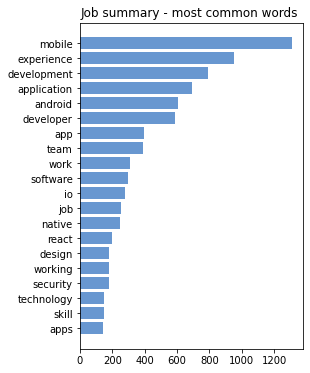

In [116]:
plt.figure(figsize=(4, 6))

wf = Counter(b1)

wf_most_common = wf.most_common(20)
words = [w[0] for w in wf_most_common]
freqs = [w[1] for w in wf_most_common]
freqs, words = zip(*sorted(zip(freqs, words)))

plt.barh(words, freqs, color = "#6897d0")
plt.title("Job summary - most common words ")
plt.show()

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

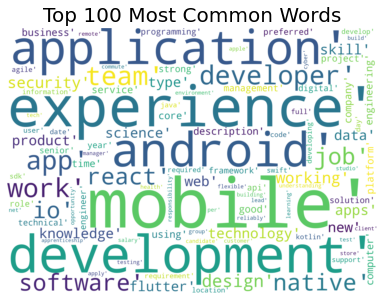

In [117]:
mostcommon = FreqDist(b1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [118]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['mobile', 'experience', 'development', 'application', 'android', 'developer', 'app', 'team', 'work', 'software', 'io', 'job', 'native', 'react', 'design', 'security', 'working', 'technology', 'skill', 'apps', 'knowledge', 'web', 'data', 'new', 'product', 'type', 'science', 'flutter', 'description', 'computer', 'using', 'company', 'service', 'engineering', 'business', 'core', 'good', 'platform', 'time', 'project', 'management', 'strong', 'preferred', 'role', 'programming', 'digital', 'engineer', 'api', 'technical', 'framework', 'senior', 'year', 'solution', 'requirement', 'code', 'develop', 'sdk', 'required', 'location', 'date', 'kotlin', 'agile', 'support', 'full', 'user', 'swift', 'information', 'java', 'day', 'developing', 'understanding', 'store', 'customer', 'environment', 'net', 'build', 'responsibility', 'client', 'opportunity', 'salary', 'building', 'per', 'studio', 'test', 'group', 'lead', 'testing', 'apply', 'learning', 'remote', 'tech', 'candidate', 'health', 'apple', 'manag

In [119]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['android', 'app', 'io', 'job', 'native', 'react', 'design', 'product', 'flutter', 'business', 'management', 'project', 'programming', 'digital', 'engineer', 'api', 
                'kotlin', 'agile', 'swift', 'java', 'net', 'build', 'testing', 'learning', 'remote', 'health', 'apple', 'flexible']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_1 = stop_words(b1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

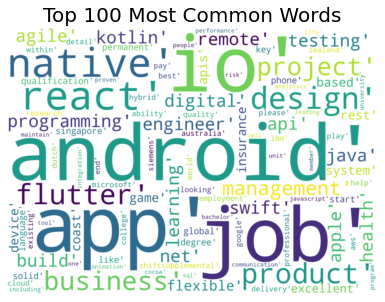

In [120]:
mostcommon = FreqDist(new_list_summary_1).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [121]:
lista_100 = []
for i in mostcommon:
    lista_100.append(i[0])

print(lista_100)

['android', 'app', 'io', 'job', 'native', 'react', 'design', 'product', 'flutter', 'business', 'project', 'management', 'programming', 'digital', 'engineer', 'api', 'kotlin', 'agile', 'swift', 'java', 'net', 'build', 'testing', 'learning', 'remote', 'health', 'apple', 'flexible', 'system', 'coast', 'based', 'game', 'insurance', 'device', 'rest', 'apis', 'excellent', 'qualification', 'like', 'singapore', 'phone', 'global', 'permanent', 'key', 'degree', 'language', 'solid', 'start', 'shiftsupplemental', 'cloud', 'hybrid', 'siemens', 'world', 'college', 'quality', 'help', 'pay', 'google', 'play', 'please', 'dutch', 'zealand', 'ibm', 'ability', 'professional', 'best', 'looking', 'within', 'employment', 'research', 'australia', 'end', 'microsoft', 'aws', 'delivery', 'detail', 'existing', 'performance', 'proven', 'bachelor', 'program', 'unit', 'one', 'life', 'javascript', 'sql', 'university', 'people', 'including', 'animation', 'cocoa', 'maintain', 'integration', 'cell', 'tool', 'risk', 'com

In [122]:
# remove 100 most common words

# new stopwords list
stopwords = []
for i in mostcommon:
    if i[0] in ['android', 'app', 'io', 'job', 'native', 'react', 'design', 'product', 'flutter', 'business', 'management', 'project', 'programming', 'digital', 'engineer', 'api', 
                'kotlin', 'agile', 'swift', 'java', 'net', 'build', 'testing', 'learning', 'remote', 'health', 'apple', 'flexible', 'rest', 'qualification', 'degree', 'cloud', 
                'hybrid', 'google', 'microsoft', 'aws', 'bachelor', 'program', 'javascript', 'sql', 'university', 'animation']:
        pass
    else:
        stopwords.append(i[0])

# drop stopwords, 100 mostcommon
def stop_words(all_word_summary):
  words = [w for w in all_word_summary if w not in stopwords]
  return words

new_list_summary_2 = stop_words(new_list_summary_1)

/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
/Users/irena/opt/anaconda3/lib/python3.9/site-packages/wordcloud/wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength inst

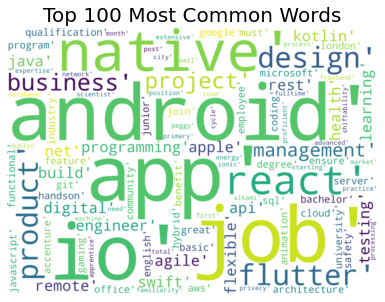

In [123]:
mostcommon = FreqDist(new_list_summary_2).most_common(100)
wordcloud = WordCloud(width=2500, height=1800,background_color='white').generate(str(mostcommon))
fig = plt.figure(facecolor='white')
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title('Top 100 Most Common Words', fontsize=20)
plt.tight_layout(pad=0)
plt.show()

In [124]:
print(mostcommon)

[('android', 603), ('app', 396), ('io', 281), ('job', 256), ('native', 251), ('react', 196), ('design', 178), ('product', 122), ('flutter', 107), ('business', 78), ('project', 70), ('management', 67), ('programming', 66), ('digital', 64), ('engineer', 63), ('api', 63), ('kotlin', 51), ('agile', 50), ('swift', 48), ('java', 46), ('net', 43), ('build', 42), ('testing', 35), ('learning', 34), ('remote', 34), ('health', 33), ('apple', 33), ('flexible', 32), ('rest', 29), ('qualification', 28), ('degree', 26), ('cloud', 25), ('hybrid', 25), ('google', 24), ('microsoft', 21), ('aws', 21), ('bachelor', 20), ('program', 20), ('javascript', 20), ('sql', 19), ('university', 19), ('animation', 19), ('git', 18), ('feature', 18), ('must', 18), ('accenture', 17), ('handson', 17), ('server', 17), ('office', 17), ('community', 17), ('safety', 17), ('industry', 17), ('great', 17), ('english', 17), ('functional', 17), ('junior', 17), ('gaming', 17), ('employee', 16), ('london', 16), ('basic', 16), ('arc

In [125]:
#lista de palabras claves por tipología

mobile_tools = ['android', " ios ", 'react native', 'flutter', 'kotlin', 'swift', 'java', ' net ', 'apple', 'rest', 'cloud', 'google', 'microsoft', ' aws ', 'javascript', ' sql ', ' git ']
mobile_skills = ['design','product', 'business', 'agile', 'testing', 'gaming', 'animation',  ]
mobile_education = ['engineer', 'degree', 'bachelor' ]
mobile_benefits = ['health', 'flexible', 'hybrid']

CONVERTIR KEYWORDS EN COLUMNAS DEL DATASET

In [126]:
tools = data_tools + web_tools + cyber_tools + devOps_tools  + mobile_tools
print (len(tools))
print (tools)

skills = data_skills + web_skills + cyber_skills + devOps_skills  + mobile_skills
print (len(skills))
print (skills)

education = data_education + web_education + cyber_education + devOps_education  + mobile_education
print (len(education))
print (education)

benefits = data_benefits + web_benefits + cyber_benefits + devOps_benefits  + mobile_benefits
print (len(benefits))
print (benefits)

63
['python', 'google', 'sql', 'azure', 'cloud', ' r ', 'salesforce', 'aws', ' scala ', 'node', 'php', 'google', 'html', 'sql', 'javascript', 'agile', 'azure', 'cloud', 'adobe', 'python', 'wordpress', 'microsoft', 'aws', 'rest', 'angular', 'seo', 'shopify', 'react', 'git', 'vuejs', 'cloud', 'flutter', 'microsoft', 'aws', 'splunk', 'azure', 'cloud', 'aws', 'azure', 'kubernetes', 'microsoft', 'linux', 'python', 'java', 'sql', 'docker', 'android', ' ios ', 'react native', 'flutter', 'kotlin', 'swift', 'java', ' net ', 'apple', 'rest', 'cloud', 'google', 'microsoft', ' aws ', 'javascript', ' sql ', ' git ']
44
['nlp', 'artificial intelligence', 'design', 'financial', 'big data', 'consulting', 'testing', 'data minning', 'machine learning', 'statistic', 'api', 'agile', 'creative', 'testing', 'quality', 'quality', 'english', 'graphic', 'fullstack', 'scrum', 'blockchain', 'design', 'testing', 'architecture', 'architect', 'consulting', 'governance', 'bank', 'system', 'automation', 'agile', 'int

In [127]:
keywords = tools + skills + education + benefits
keywords = set(keywords)
keywords = list(keywords)
print (len(keywords))
print (keywords)

92
['vuejs', 'react', 'node', 'kotlin', 'qualification', 'agile', 'animation', 'data minning', 'flexible working', 'python', 'integration', 'splunk', 'quality', 'bachelor degree', 'phd science', ' git ', 'html', 'fullstack', 'gaming', 'design', 'system', 'mastercard', 'architect', 'container', ' net ', 'master', 'consulting', 'salesforce', 'bachelor', 'react native', 'pension', 'testing', 'javascript', 'science', 'health', 'android', 'architecture', 'holiday', 'google', 'azure', 'java', 'scrum', 'microsoft', 'flexible', 'bank', 'sql', 'rest', 'cloud', 'seo', 'git', ' sql ', 'product', 'graduate', ' ios ', 'machine learning', 'graphic', 'wordpress', 'automation', 'blockchain', 'certification', 'kubernetes', 'degree', 'remote', 'hybrid', 'php', 'financial', 'aws', 'angular', 'english', 'flutter', 'scripting', 'business', 'artificial intelligence', 'docker', 'api', 'certified', 'creative', 'shopify', 'governance', ' scala ', 'life assurance', 'statistic', 'engineer', ' aws ', 'apple', 'sw

In [128]:
data_new = pd.read_csv('/Volumes/T7 warehouse/Dropbox/Irena/dev/cursos/big data/practica-final/analysis-exploration-nlp/merge_all.csv',
                    error_bad_lines=False, engine="python")

In [129]:
data_new[keywords] = np.NaN

In [130]:
pd.set_option('display.max_columns', None)

In [131]:
data_new.head()

,work_year,experience_level,employment_type,job,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_summary,vuejs,react,node,kotlin,qualification,agile,animation,data minning,flexible working,python,integration,splunk,quality,bachelor degree,phd science,git,html,fullstack,gaming,design,system,mastercard,architect,container,net,master,consulting,salesforce,bachelor,react native,pension,testing,javascript,science,health,android,architecture,holiday,google,azure,java,scrum,microsoft,flexible,bank,sql,rest,cloud,seo,git,sql,product,graduate,ios,machine learning,graphic,wordpress,automation,blockchain,certification,kubernetes,degree,remote,hybrid,php,financial,aws,angular,english,flutter,scripting,business,artificial intelligence,docker,api,certified,creative,shopify,governance,scala,life assurance,statistic,engineer,aws,apple,swift,r,nlp,ops,adobe,big data,linux
0,2022,EN,FT,Cyber Security,Cyber Program Manager,63000,USD,63000,United States,50,United States,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022,MI,FT,Cyber Security,Security Analyst,95000,USD,95000,United States,0,United States,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022,MI,FT,Cyber Security,Security Analyst,70000,USD,70000,United States,0,United States,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2022,MI,FT,Cyber Security,IT Security Analyst,250000,BRL,48853,Brazil,50,Brazil,L,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2022,EN,CT,Cyber Security,Cyber Security Analyst,120000,USD,120000,Botswana,100,Botswana,S,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
data_new = data_new.dropna(subset=["job_summary"])
print('Tamaño del dataset -->', data_new.shape)

Tamaño del dataset --> (6667, 105)


In [133]:
data_new['job_summary']

2099    Trustwave is a leading cybersecurity and manag...
2100    About the job: What makes Cognizant a unique p...
2101    Have you studied Mechatronic, Electrical or In...
2102    Posted: 16/08/2022Closing Date: 15/09/2022Job ...
2103    IT & Telecomms IT Security Sydney Permanent / ...
                              ...                        
8768    Web Developer (Node.js React JavaScript). Inno...
8769      EKM is the home to tens of thousands of onli...
8770    A leading provider of Software/ Web Solutions ...
8771     Role: PHP Developer Location: Home Based Sala...
8772     Web Developer  Lookers Group Technology, home...
Name: job_summary, Length: 6667, dtype: object

In [134]:
import re
import string
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
import re
import string
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')

st = set(stopwords.words('english'))
punc= string.punctuation

def lower (text):
    text = text.lower()
    return text

def remove_stop_words(text):
    return " ".join([word for word in str(text).split() if word not in st])

def removeNumbers(text):
    """ Removes integers """
    text = ''.join([i for i in text if not i.isdigit()])         
    return text

def remove_punc(text):
    """custom function to remove the frequent words"""
    return " ".join([word for word in str(text).split() if word not in punc])

data_new['job_summary']= data_new['job_summary'].apply(lambda text: lower(text))
data_new['job_summary']= data_new['job_summary'].apply(lambda text: remove_stop_words(text))
data_new['job_summary']= data_new['job_summary'].apply(lambda text: removeNumbers(text))
data_new['job_summary']= data_new['job_summary'].apply(lambda text: remove_punc(text))

[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/irena/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [135]:
data_new['job_summary']

2099    trustwave leading cybersecurity managed securi...
2100    job: makes cognizant unique place work? combin...
2101    studied mechatronic, electrical information sy...
2102    posted: //closing date: //job type: permanent ...
2103    telecomms security sydney permanent full time ...
                              ...                        
8768    web developer (node.js react javascript). inno...
8769    ekm home tens thousands online shops, shop own...
8770    leading provider software/ web solutions heart...
8771    role: php developer location: home based salar...
8772    web developer lookers group technology, home b...
Name: job_summary, Length: 6667, dtype: object

In [136]:
for word in keywords:
    def calc_new_col(row):
        if word in row['job_summary']:
            return 1
        else:
            return 0
    data_new[word] = data_new.apply(calc_new_col, axis=1)

In [137]:
print (keywords)

['vuejs', 'react', 'node', 'kotlin', 'qualification', 'agile', 'animation', 'data minning', 'flexible working', 'python', 'integration', 'splunk', 'quality', 'bachelor degree', 'phd science', ' git ', 'html', 'fullstack', 'gaming', 'design', 'system', 'mastercard', 'architect', 'container', ' net ', 'master', 'consulting', 'salesforce', 'bachelor', 'react native', 'pension', 'testing', 'javascript', 'science', 'health', 'android', 'architecture', 'holiday', 'google', 'azure', 'java', 'scrum', 'microsoft', 'flexible', 'bank', 'sql', 'rest', 'cloud', 'seo', 'git', ' sql ', 'product', 'graduate', ' ios ', 'machine learning', 'graphic', 'wordpress', 'automation', 'blockchain', 'certification', 'kubernetes', 'degree', 'remote', 'hybrid', 'php', 'financial', 'aws', 'angular', 'english', 'flutter', 'scripting', 'business', 'artificial intelligence', 'docker', 'api', 'certified', 'creative', 'shopify', 'governance', ' scala ', 'life assurance', 'statistic', 'engineer', ' aws ', 'apple', 'swift

In [138]:
data_new.head(4)

,work_year,experience_level,employment_type,job,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,job_summary,vuejs,react,node,kotlin,qualification,agile,animation,data minning,flexible working,python,integration,splunk,quality,bachelor degree,phd science,git,html,fullstack,gaming,design,system,mastercard,architect,container,net,master,consulting,salesforce,bachelor,react native,pension,testing,javascript,science,health,android,architecture,holiday,google,azure,java,scrum,microsoft,flexible,bank,sql,rest,cloud,seo,git,sql,product,graduate,ios,machine learning,graphic,wordpress,automation,blockchain,certification,kubernetes,degree,remote,hybrid,php,financial,aws,angular,english,flutter,scripting,business,artificial intelligence,docker,api,certified,creative,shopify,governance,scala,life assurance,statistic,engineer,aws,apple,swift,r,nlp,ops,adobe,big data,linux
2099,2022,NaN,FT,Cyber Security,Security Advisor,110107,AUD,73732,Australia,0,Australia,L,trustwave leading cybersecurity managed securi...,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2100,2022,NaN,FT,Cyber Security,Cyber Security,140000,AUD,93749,Australia,0,Australia,L,job: makes cognizant unique place work? combin...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2101,2022,NaN,FT,DevOps,Graduate Security Systems Engineer,55000,AUD,36830,Australia,0,Australia,L,"studied mechatronic, electrical information sy...",0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2102,2022,NaN,FT,Cyber Security,Information Security Officer/Cyber Security Sp...,141902,AUD,95023,Australia,0,Australia,L,posted: //closing date: //job type: permanent ...,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


In [139]:
data_new[data_new['docker'] == 1]['master'].count()

751

In [140]:
data_new['bachelor degree'] = data_new['bachelor degree'] + data_new['degree']

def calc_new_col(row):
    if int(row['bachelor degree']) == 2:
        return 1
    else:
        return row['bachelor degree']
data_new['bachelor degree'] = data_new.apply(calc_new_col, axis=1)

In [141]:
data_new = data_new.drop(['degree'], axis=1)

In [142]:
data_new['bachelor degree'] = data_new['bachelor degree'] + data_new['bachelor'] 

def calc_new_col(row):
    if int(row['bachelor degree']) == 2:
        return 1
    else:
        return row['bachelor degree']
data_new['bachelor degree'] = data_new.apply(calc_new_col, axis=1)

In [143]:
data_new = data_new.drop(['bachelor'], axis=1)

In [144]:
data_new['flexible working'] = data_new['flexible working'] + data_new['flexible'] 

def calc_new_col(row):
    if int(row['flexible working']) == 2:
        return 1
    else:
        return row['flexible working']
data_new['flexible working'] = data_new.apply(calc_new_col, axis=1)

In [145]:
data_new = data_new.drop(['flexible'], axis=1)

In [146]:
data_new['docker'] = data_new['docker'] + data_new['container'] 

def calc_new_col(row):
    if int(row['docker']) == 2:
        return 1
    else:
        return row['docker']
data_new['docker'] = data_new.apply(calc_new_col, axis=1)

In [147]:
data_new = data_new.drop(['container'], axis=1)

In [148]:
data_new.shape

(6667, 101)

In [149]:
data_new.to_csv('data_features.csv', index = False)